In [1]:
#import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
df=pd.read_csv('911.csv')
df.head(5)
#read data file

,lat,lng,desc,zip,title,timeStamp,twp,addr,e
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:40:00,NEW HANOVER,REINDEER CT & DEAD END,1
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:40:00,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 17:40:00,NORRISTOWN,HAWS AVE,1
3,40.116153,-75.343513,AIRY ST & SWEDE ST; NORRISTOWN; Station 308A;...,19401.0,EMS: CARDIAC EMERGENCY,2015-12-10 17:40:01,NORRISTOWN,AIRY ST & SWEDE ST,1
4,40.251492,-75.603350,CHERRYWOOD CT & DEAD END; LOWER POTTSGROVE; S...,NaN,EMS: DIZZINESS,2015-12-10 17:40:01,LOWER POTTSGROVE,CHERRYWOOD CT & DEAD END,1


In [3]:
df.info()
#description of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99492 entries, 0 to 99491
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   lat        99492 non-null  float64
 1   lng        99492 non-null  float64
 2   desc       99492 non-null  object 
 3   zip        86637 non-null  float64
 4   title      99492 non-null  object 
 5   timeStamp  99492 non-null  object 
 6   twp        99449 non-null  object 
 7   addr       98973 non-null  object 
 8   e          99492 non-null  int64  
dtypes: float64(3), int64(1), object(5)
memory usage: 6.8+ MB


In [47]:
df.isnull().sum()

lat                0
lng                0
desc               0
zip            12855
title              0
timeStamp          0
twp               43
addr             519
e                  0
reason             0
Hour               0
Month              0
Day of week        0
Date               0
dtype: int64

# Answering some basic questions in the dataset


TOP 5 ZIP CODE

In [48]:
df['zip'].value_counts().head(5)

19401.0    6979
19464.0    6643
19403.0    4854
19446.0    4748
19406.0    3174
Name: zip, dtype: int64

TOP 5 TOWNS THAT CALLS CAME FROM 

In [49]:
toptown=df['twp'].value_counts().head(5)
toptown


LOWER MERION    8443
ABINGTON        5977
NORRISTOWN      5890
UPPER MERION    5227
CHELTENHAM      4575
Name: twp, dtype: int64

In [50]:
df['title'].unique()

array(['EMS: BACK PAINS/INJURY', 'EMS: DIABETIC EMERGENCY',
       'Fire: GAS-ODOR/LEAK', 'EMS: CARDIAC EMERGENCY', 'EMS: DIZZINESS',
       'EMS: HEAD INJURY', 'EMS: NAUSEA/VOMITING',
       'EMS: RESPIRATORY EMERGENCY', 'EMS: SYNCOPAL EPISODE',
       'Traffic: VEHICLE ACCIDENT -', 'EMS: VEHICLE ACCIDENT',
       'Traffic: DISABLED VEHICLE -', 'Fire: APPLIANCE FIRE',
       'EMS: GENERAL WEAKNESS', 'Fire: CARBON MONOXIDE DETECTOR',
       'EMS: UNKNOWN MEDICAL EMERGENCY', 'EMS: UNRESPONSIVE SUBJECT',
       'Fire: VEHICLE ACCIDENT', 'EMS: ALTERED MENTAL STATUS',
       'Fire: FIRE ALARM', 'EMS: CVA/STROKE',
       'Traffic: ROAD OBSTRUCTION -', 'EMS: SUBJECT IN PAIN',
       'EMS: HEMORRHAGING', 'EMS: FALL VICTIM', 'EMS: ASSAULT VICTIM',
       'EMS: SEIZURES', 'EMS: MEDICAL ALERT ALARM',
       'EMS: ABDOMINAL PAINS', 'Fire: PUMP DETAIL',
       'Fire: FIRE INVESTIGATION', 'EMS: OVERDOSE', 'EMS: MATERNITY',
       'EMS: UNCONSCIOUS SUBJECT', 'EMS: CHOKING', 'EMS: LACERATIONS',
     

Top five town with the highest amount of 911 calls

# Analysying the title column and creating a new reason column 

spliting the title column and creating a new column that focuses on the reasons for call

In [51]:
df['title'].iloc[0] #split by the ':'

'EMS: BACK PAINS/INJURY'

In [8]:
df['reason']=df['title'].str.split(':',expand=True)[0]

In [9]:
df['reason'].value_counts()

EMS        48877
Traffic    35695
Fire       14920
Name: reason, dtype: int64

<Axes: xlabel='reason', ylabel='count'>

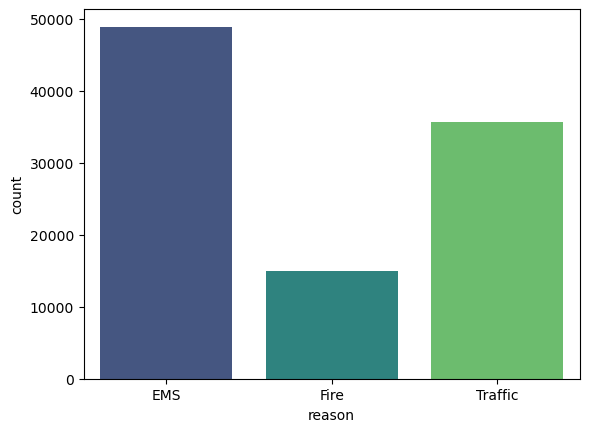

In [10]:
sns.countplot(x='reason', data = df, palette='viridis')

Most common reasons for calling are EMS followed by traffic and Fire

# Focus on the time information

In [11]:
type(df['timeStamp'].iloc[0]) #data type for the timestamp

str

In [12]:
df['timeStamp']=pd.to_datetime(df['timeStamp']) #converting the timestamp to pd datetime

In [13]:
type(df['timeStamp'].iloc[0])

pandas._libs.tslibs.timestamps.Timestamp

In [14]:
time=df['timeStamp'].iloc[0]
time.hour #grab the hour in the datetime data

17

Converted the timestamp column from string to datatime

In [15]:
time.day


10

In [52]:
df['timeStamp'].iloc[0]

Timestamp('2015-12-10 17:40:00')

# Creating different columns from the timestamp that shows Hour, Day, Month the calls came in

In [17]:
df['Hour']=df['timeStamp'].apply(lambda time: time.hour) #hour the call came in

In [18]:
df['Month']=df['timeStamp'].apply(lambda time: time.month) #month the call came in
df['Day of week']=df['timeStamp'].apply(lambda time: time.dayofweek)#Day of week the call came in

In [54]:
df.head(2) # the dataframe shows the newly created column

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,reason,Hour,Month,Day of week,Date
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:40:00,NEW HANOVER,REINDEER CT & DEAD END,1,EMS,17,12,Thu,2015-12-10
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:40:00,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1,EMS,17,12,Thu,2015-12-10


mapping the string names to day of week

In [20]:
datemap = {0:'Mon', 1:'Tue',2:'Wed',3:'Thu',4:'Fri',5:'Sat',6:'Sun'}

In [21]:
df['Day of week'] = df['Day of week'].map(datemap)

maping out the interger the weekdays were stored to str

<Axes: xlabel='Day of week', ylabel='count'>

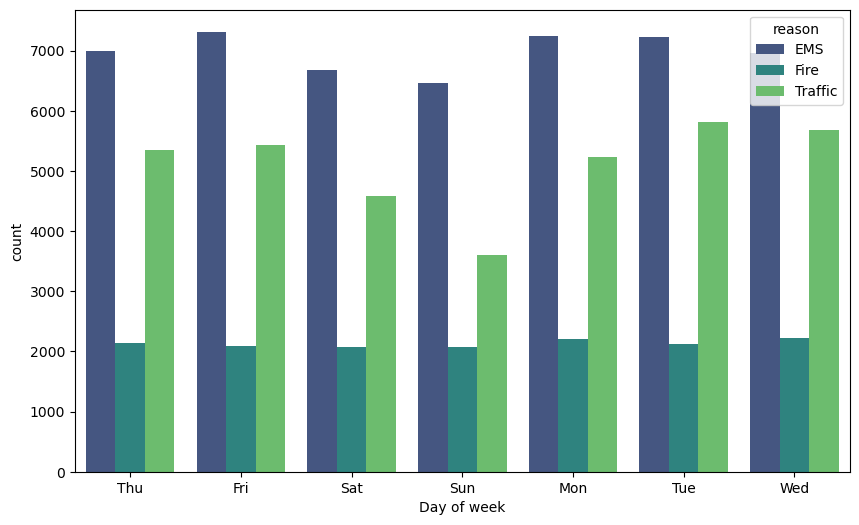

In [60]:
#count of calls Day of week based on reason
plt.figure(figsize=(10,6))
sns.countplot(x=df['Day of week'], hue=df['reason'], palette='viridis')


<Axes: xlabel='Month', ylabel='count'>

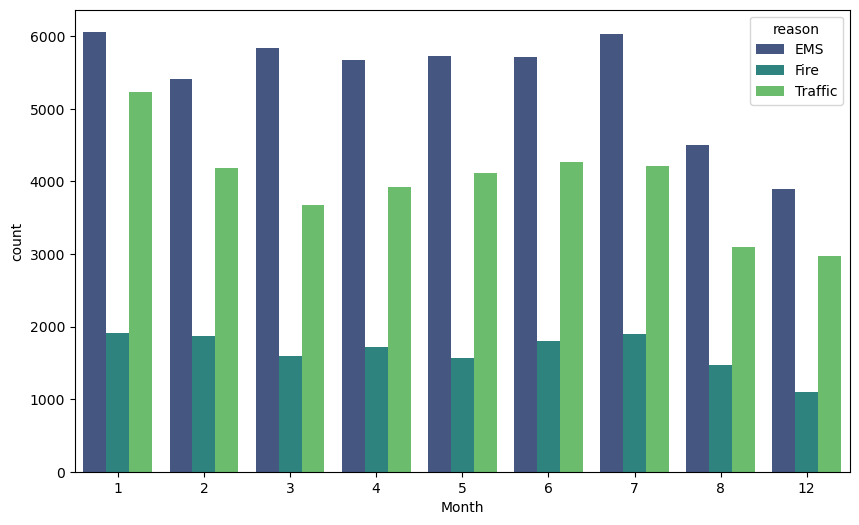

In [62]:
#count of calls Day of week based on reason
plt.figure(figsize=(10,6))
sns.countplot(x=df['Month'], hue=df['reason'], palette='viridis')


Missing month 9,10 and 11

In [23]:
byMonth = df.groupby('Month').count()
byMonth

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,reason,Hour,Day of week
Month,,,,,,,,,,,,
1,13205,13205,13205,11527,13205,13205,13203,13096,13205,13205,13205,13205
2,11467,11467,11467,9930,11467,11467,11465,11396,11467,11467,11467,11467
3,11101,11101,11101,9755,11101,11101,11092,11059,11101,11101,11101,11101
4,11326,11326,11326,9895,11326,11326,11323,11283,11326,11326,11326,11326
5,11423,11423,11423,9946,11423,11423,11420,11378,11423,11423,11423,11423
6,11786,11786,11786,10212,11786,11786,11777,11732,11786,11786,11786,11786
7,12137,12137,12137,10633,12137,12137,12133,12088,12137,12137,12137,12137
8,9078,9078,9078,7832,9078,9078,9073,9025,9078,9078,9078,9078
12,7969,7969,7969,6907,7969,7969,7963,7916,7969,7969,7969,7969


<Axes: xlabel='Month'>

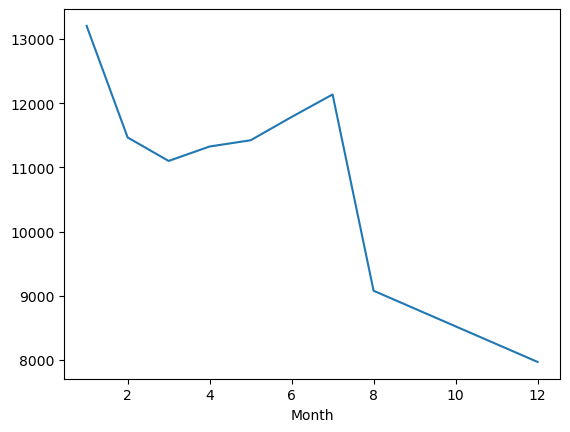

In [65]:
byMonth['title'].plot()

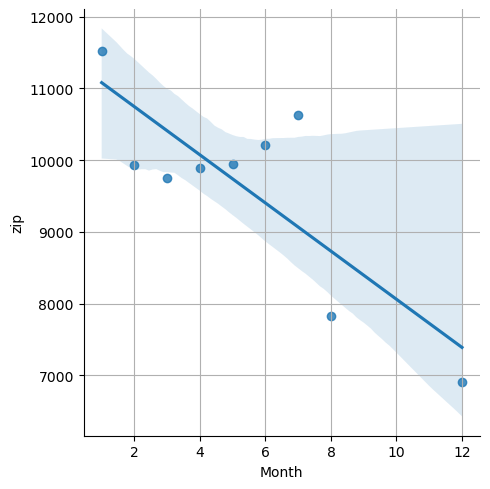

In [25]:
#create a linear model for call per month
sns.lmplot(x='Month', y='zip', data=byMonth.reset_index())
plt.grid(True)

In [26]:
df['Date']=df['timeStamp'].apply(lambda t:t.date())#creating a date column for analysis

In [27]:
t=df['timeStamp'].iloc[0]
t

Timestamp('2015-12-10 17:40:00')

In [28]:
t.date()#break down of the date extraction

datetime.date(2015, 12, 10)

In [29]:
df.head(3)

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,reason,Hour,Month,Day of week,Date
0,40.297876,-75.581294,REINDEER CT & DEAD END; NEW HANOVER; Station ...,19525.0,EMS: BACK PAINS/INJURY,2015-12-10 17:40:00,NEW HANOVER,REINDEER CT & DEAD END,1,EMS,17,12,Thu,2015-12-10
1,40.258061,-75.264680,BRIAR PATH & WHITEMARSH LN; HATFIELD TOWNSHIP...,19446.0,EMS: DIABETIC EMERGENCY,2015-12-10 17:40:00,HATFIELD TOWNSHIP,BRIAR PATH & WHITEMARSH LN,1,EMS,17,12,Thu,2015-12-10
2,40.121182,-75.351975,HAWS AVE; NORRISTOWN; 2015-12-10 @ 14:39:21-St...,19401.0,Fire: GAS-ODOR/LEAK,2015-12-10 17:40:00,NORRISTOWN,HAWS AVE,1,Fire,17,12,Thu,2015-12-10


In [30]:
df.groupby('Date').count().head() #difference between value_counts and count 

,lat,lng,desc,zip,title,timeStamp,twp,addr,e,reason,Hour,Month,Day of week
Date,,,,,,,,,,,,,
2015-12-10,115,115,115,100,115,115,115,113,115,115,115,115,115
2015-12-11,396,396,396,333,396,396,395,391,396,396,396,396,396
2015-12-12,403,403,403,333,403,403,403,401,403,403,403,403,403
2015-12-13,319,319,319,280,319,319,319,317,319,319,319,319,319
2015-12-14,447,447,447,387,447,447,446,445,447,447,447,447,447


In [31]:
#value_counts() is a pandas method that is applied to a pandas Series.
#It returns a new Series containing the counts of unique values in the original Series.
#The resulting Series is sorted in descending order by default.
#This method is commonly used to understand the frequency distribution of values in a categorical variabl


In [32]:
#count() is a method that is applied to a pandas DataFrame or Series. It returns the number of non-null values in the DataFrame or Series. This method is useful for quickly determining the count of valid values in 
#a column or dataset

#In summary, value_counts() is used to count the occurrences of each unique value in a Series, while count() is used to count the number of non-null values in a DataFrame or Series.

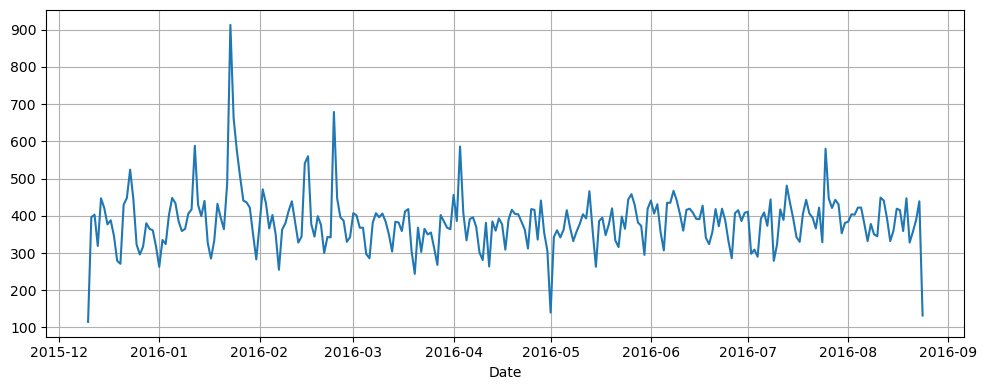

In [33]:
plt.figure(figsize=(10,4))
df.groupby('Date').count()['reason'].plot()

plt.tight_layout()
plt.grid(True)

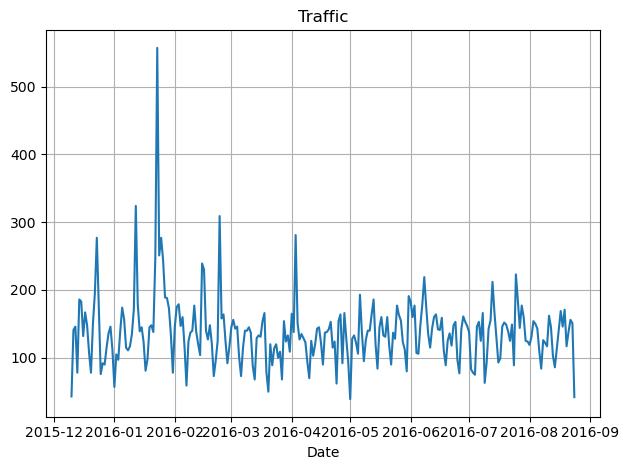

In [34]:
df[df['reason']=='Traffic'].groupby('Date').count()['reason'].plot()
plt.title ('Traffic')
plt.tight_layout()
plt.grid(True)

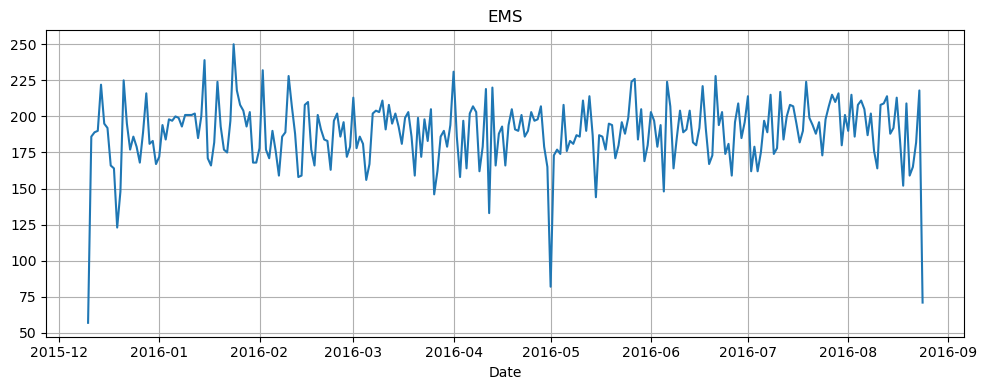

In [35]:
plt.figure(figsize=(10,4))
df[df['reason']=='EMS'].groupby('Date').count()['reason'].plot()
plt.title ('EMS')
plt.tight_layout()
plt.grid(True)

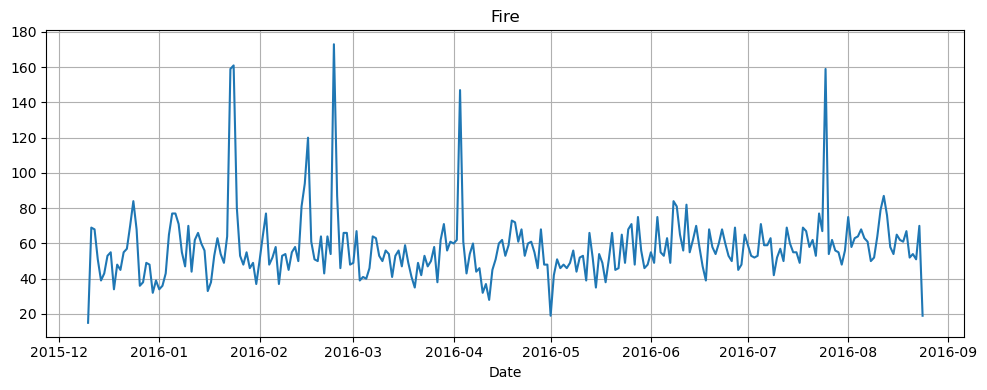

In [36]:
plt.figure(figsize=(10,4))
df[df['reason']=='Fire'].groupby('Date').count()['reason'].plot()
plt.title ('Fire')
plt.tight_layout()
plt.grid(True)

In [37]:
dayhour=df.groupby(by=['Day of week','Hour']).count()['reason'].unstack()

<Axes: xlabel='Hour', ylabel='Day of week'>

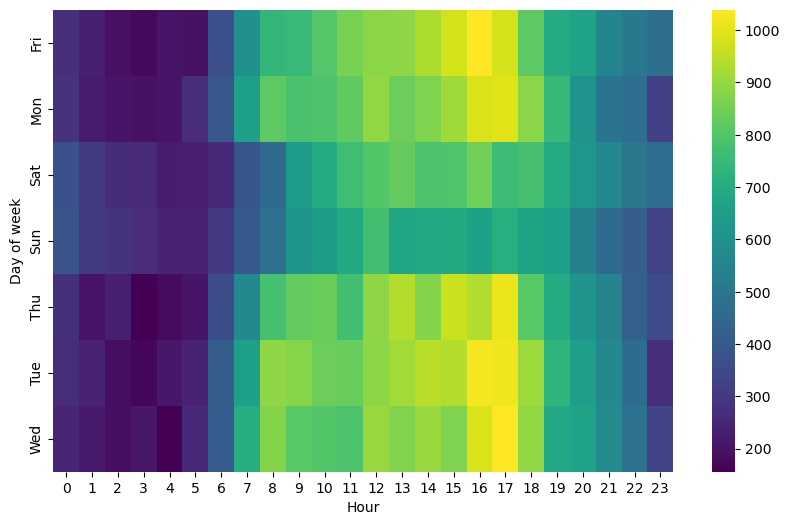

In [38]:
plt.figure(figsize=(10,6))
sns.heatmap(dayhour, cmap='viridis')

<Figure size 1000x400 with 0 Axes>

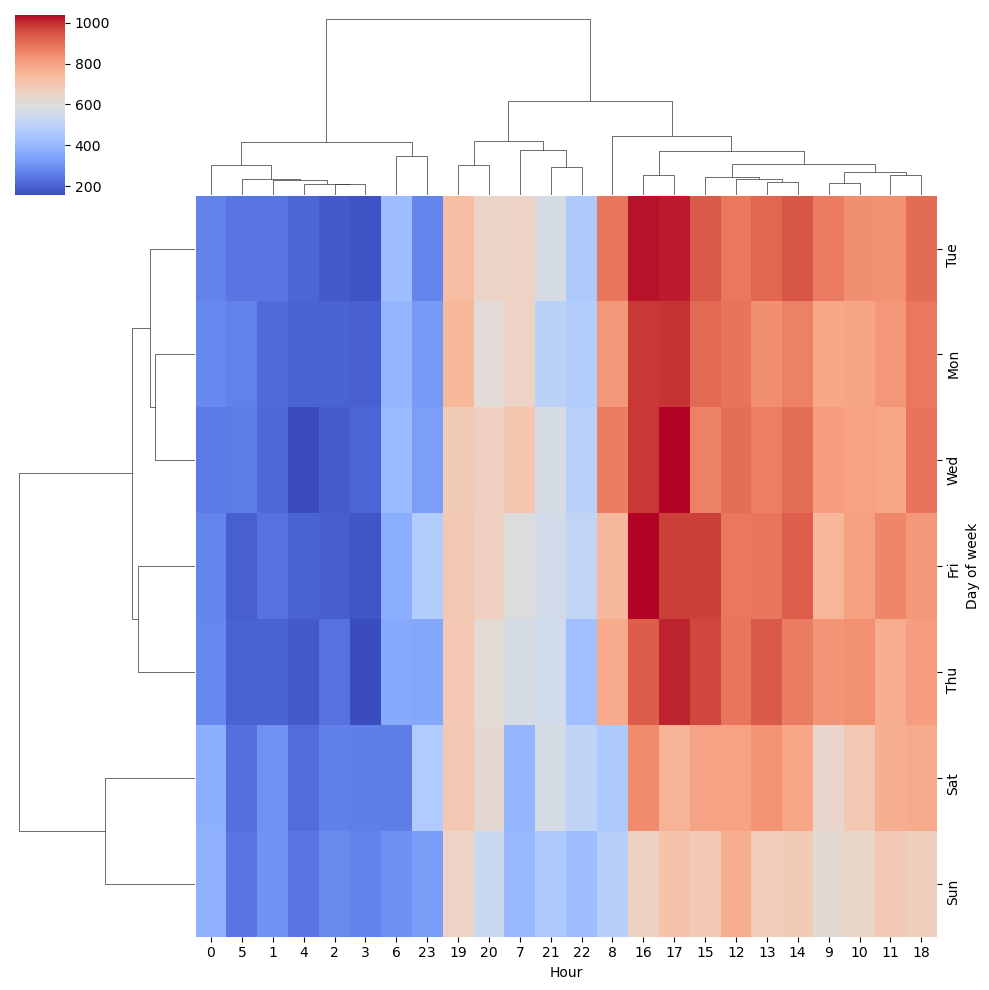

In [39]:
plt.figure(figsize=(10,4))
sns.clustermap(dayhour,cmap='coolwarm')

cluster that most calls are made during the day and less are made during the early hour of the day

In [40]:
daymonth=df.groupby(by=['Day of week','Month']).count()['reason'].unstack()

<Axes: xlabel='Month', ylabel='Day of week'>

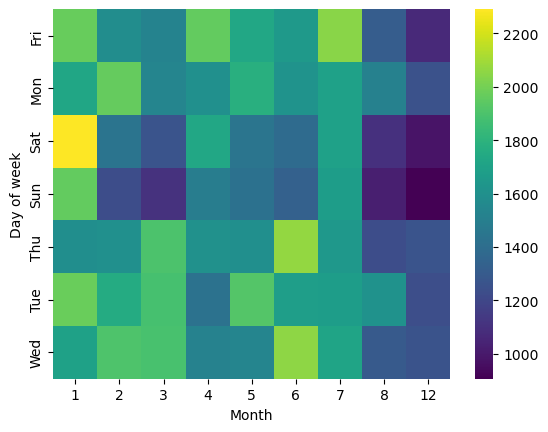

In [41]:
sns.heatmap(daymonth,cmap='viridis')

<Figure size 1000x400 with 0 Axes>

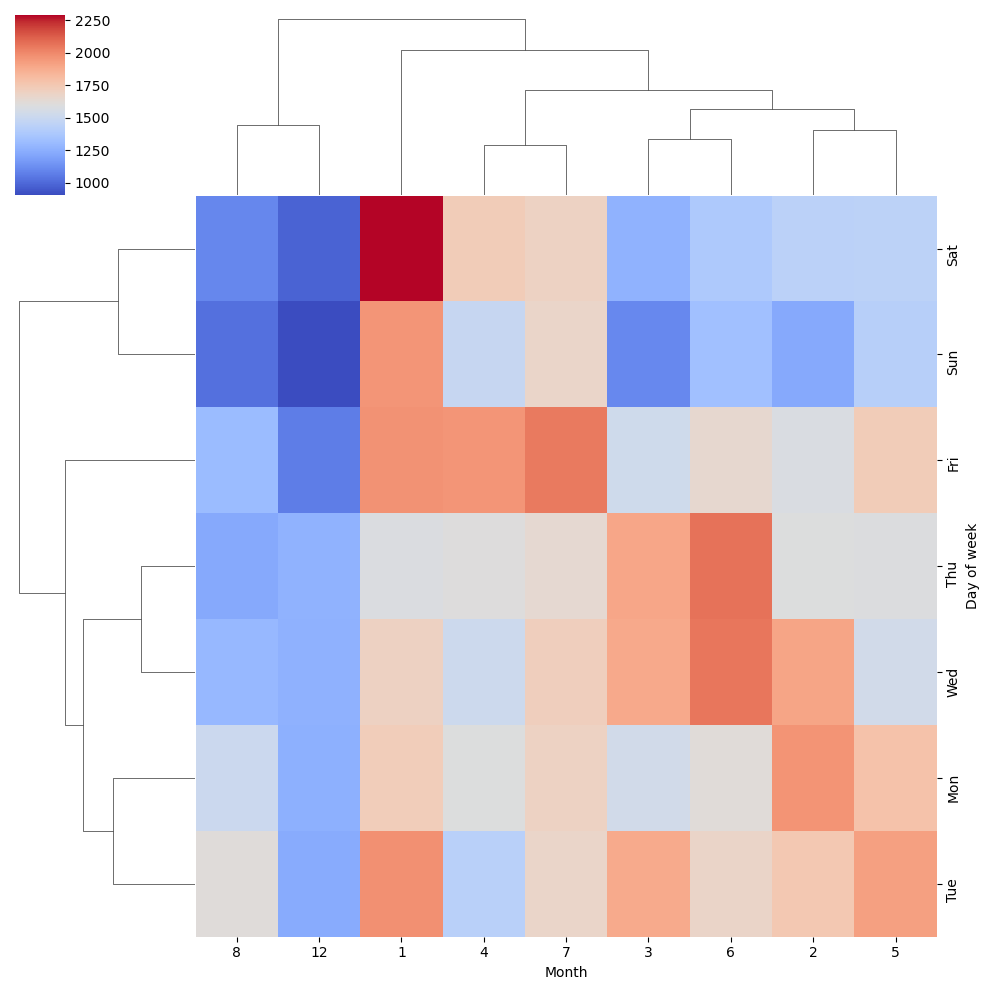

In [42]:
plt.figure(figsize=(10,4))
sns.clustermap(daymonth,cmap='coolwarm')

In [43]:
df.columns

Index(['lat', 'lng', 'desc', 'zip', 'title', 'timeStamp', 'twp', 'addr', 'e',
       'reason', 'Hour', 'Month', 'Day of week', 'Date'],
      dtype='object')

In [44]:
type(df['lat'].iloc[0])

numpy.float64

In [45]:
type(df['lng'].iloc[0])

numpy.float64

In [66]:
fig = px.scatter_mapbox(
    df,
    lat='lat',
    lon='lng',
    center={"lat": 47.1, "lon": -101.2},  # Map will be centered on Brazil
    width=600,
    height=600,
    color='reason',
    hover_data=["reason"],  # Display price when hovering mouse over house
)

fig.update_layout(mapbox_style="open-street-map")

fig.show()